In [5]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
from scipy.ndimage.measurements import find_objects
from scipy import ndimage
from scipy.ndimage.filters import gaussian_filter

%matplotlib inline
plt.rcParams["figure.figsize"] = [16,16] #Increase the size

#Load image
def object_detection(image):
    img = cv2.imread('../train/' + image + '.jpg')

    #Detect edges
    edges = cv2.Canny(img,150,200) #Canny Edge Detection #200 250
    edge = edges
    
    #Apply Gausian blur
    edges = gaussian_filter(edges, sigma=3)
    gauss = edges
    
    #Separate objects (label them differently)
    #https://stackoverflow.com/questions/16937158/extracting-connected-objects-from-an-image-in-python
    edges, nr_objects = ndimage.label(edges) 
    
    #Find objects (find x-y coordinates of rectangular)
    objects = find_objects(edges)
    
    objects_with_sizes = []
    #Calculate size of objects
    for obj in objects:
        ymin = obj[0].start
        ymax = obj[0].stop
        xmin = obj[1].start
        xmax = obj[1].stop
        area = (ymax - ymin) * (xmax - xmin)
        if(area < 115): #skip small objects
            continue
        objects_with_sizes.append([xmin, ymin, xmax, ymax, area, True])
        

    #Sort
    #https://wiki.python.org/moin/HowTo/Sorting
    objects = sorted(objects_with_sizes, key=lambda obj: obj[4])

    #Select 20 largest elements
    objects = objects[-30:] #8

    #Merge (overlapping areas
    for obj in objects:
        if(obj[5]):
            for o in objects:
                if(o[5]):
                    if(((o[0] < obj[0] and o[2] + 20 > obj[0]) or (o[0] - 20 < obj[2] and o[2] > obj[2])) and
                      ((o[1] < obj[1] and o[3] + 20 > obj[1]) or (o[1] - 20 < obj[3] and o[3] > obj[3])) and
                      o[4] < 60000 and obj[4] < 60000):
                        obj[0] = min(o[0], obj[0])
                        obj[1] = min(o[1], obj[1])
                        obj[2] = max(o[2], obj[2])
                        obj[3] = max(o[3], obj[3])
                        obj[4] = (obj[3] - obj[1]) * (obj[2] - obj[0])
                        o[5] = False #Set flag to zero
    
    #Draw boxes on image
    for obj in objects: 
        if(obj[5]):
            cv2.rectangle(img,(obj[0]-0, obj[1]-0),(obj[2]+0, obj[3]+0),(200,0,0),2)
    
    plt.subplot(221),  plt.imshow(edge)
    plt.title('Edges'), plt.xticks([]), plt.yticks([])
    plt.subplot(222),  plt.imshow(gauss)
    plt.title('Gauss'), plt.xticks([]), plt.yticks([])
    plt.subplot(223),  plt.imshow(edges)
    plt.title('Objects'), plt.xticks([]), plt.yticks([])
    plt.subplot(224),plt.imshow(img)
    plt.title(image), plt.xticks([]), plt.yticks([])

    #plt.imshow(img)
    #plt.title(image), plt.xticks([]), plt.yticks([])
    
    plt.show()

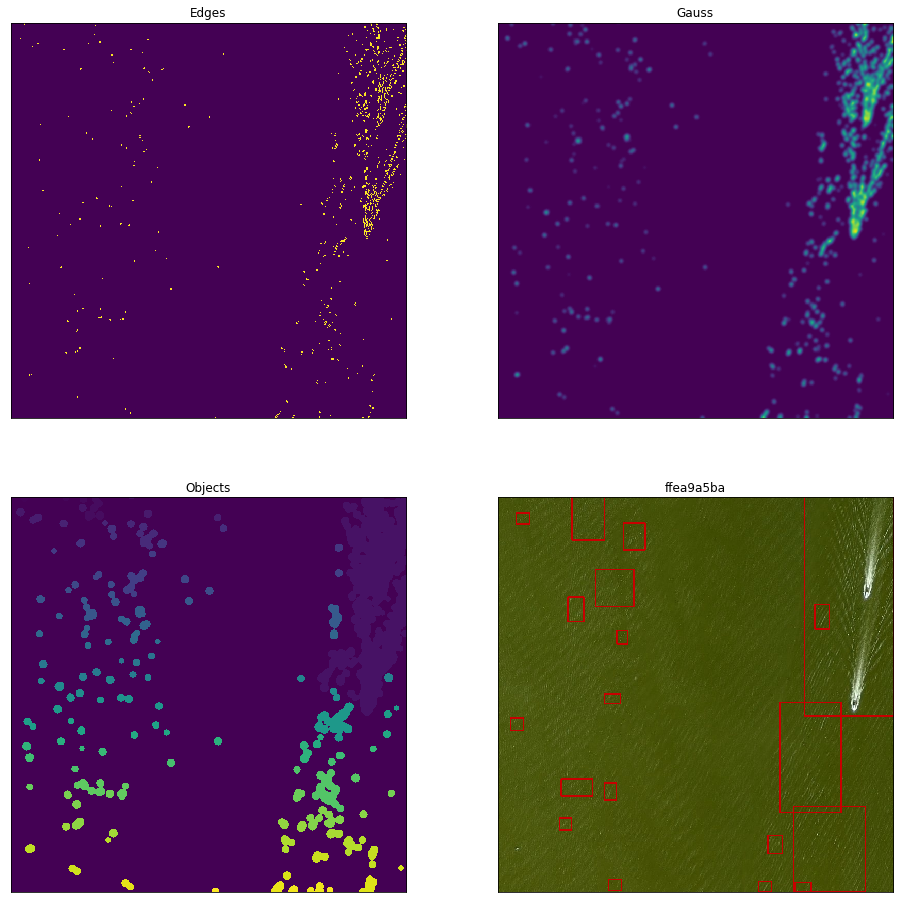

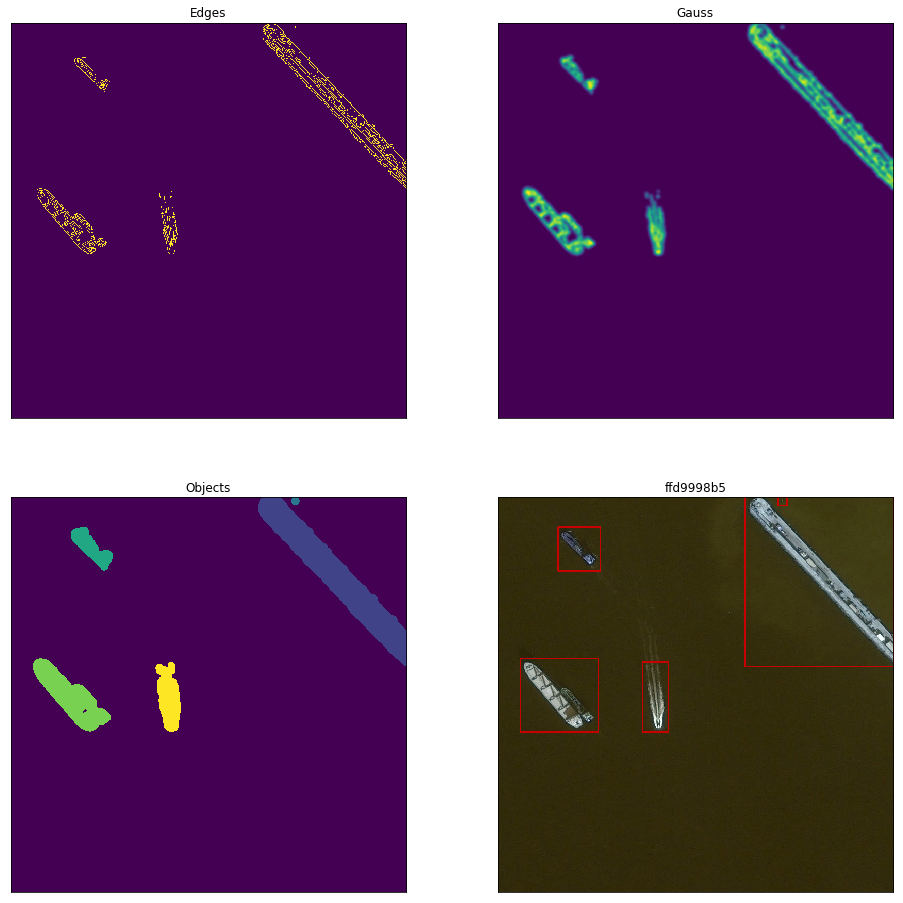

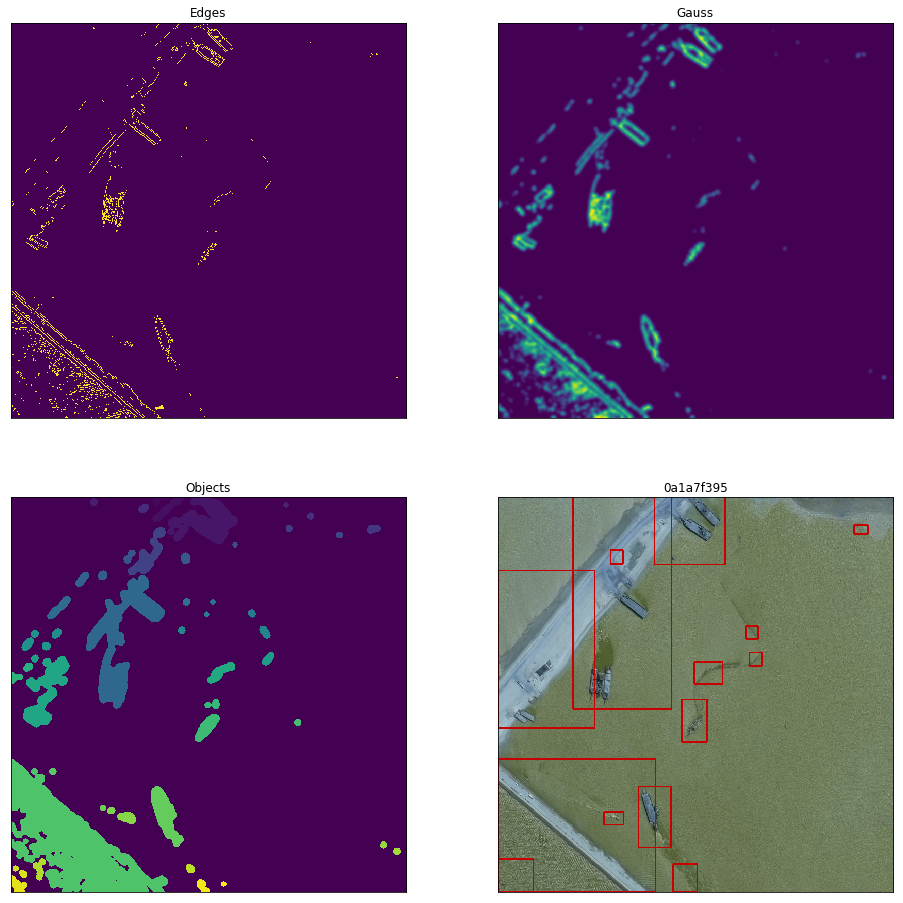

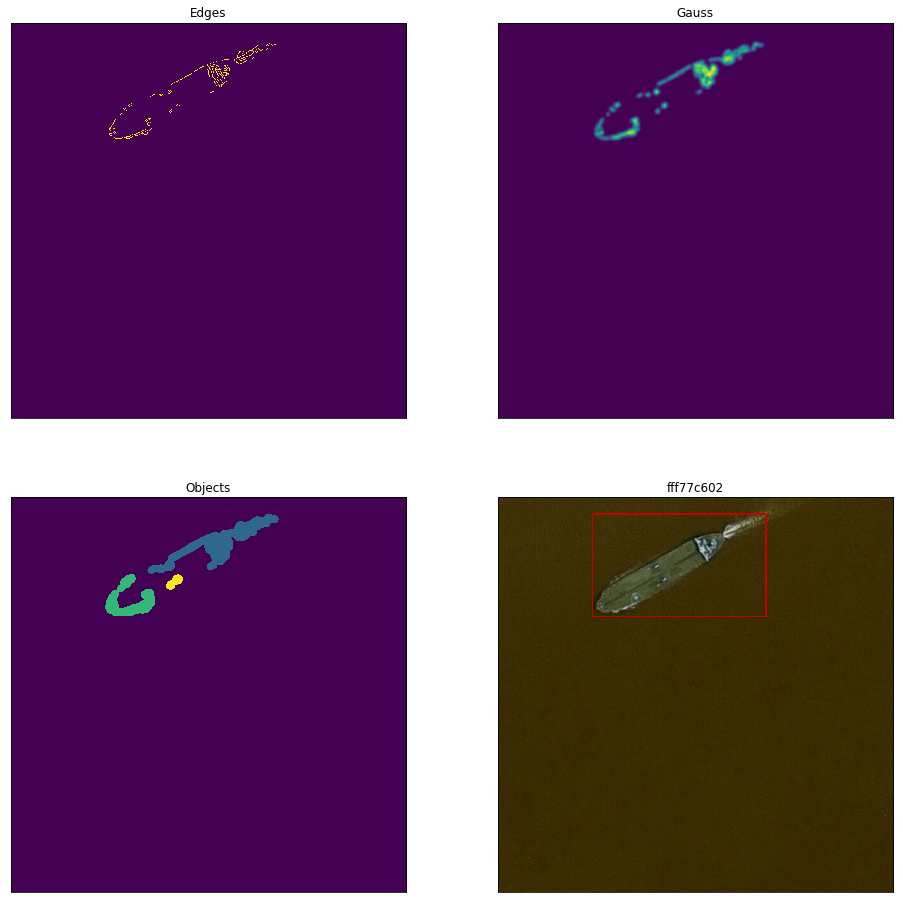

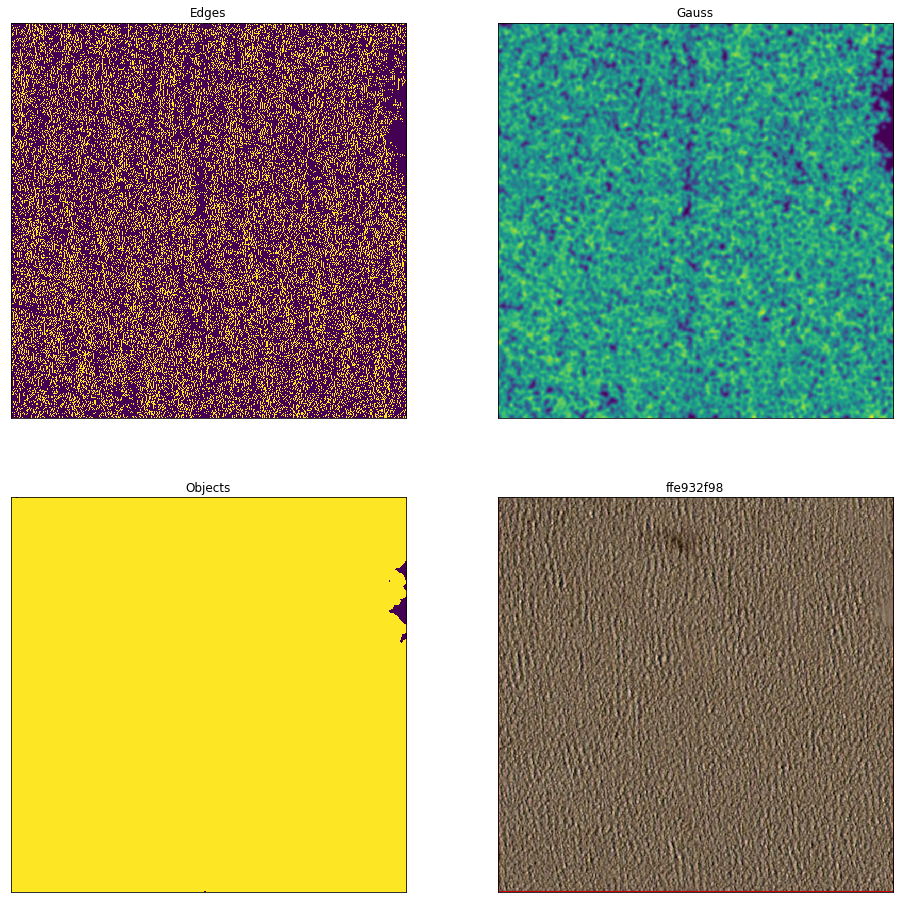

...

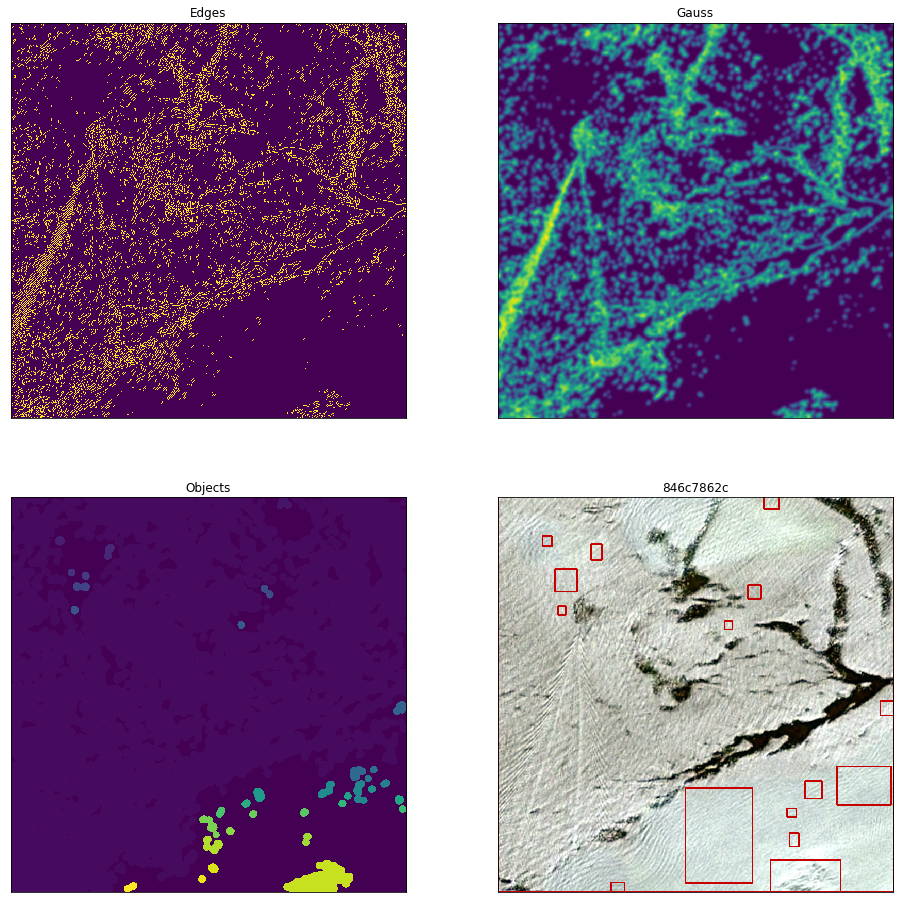

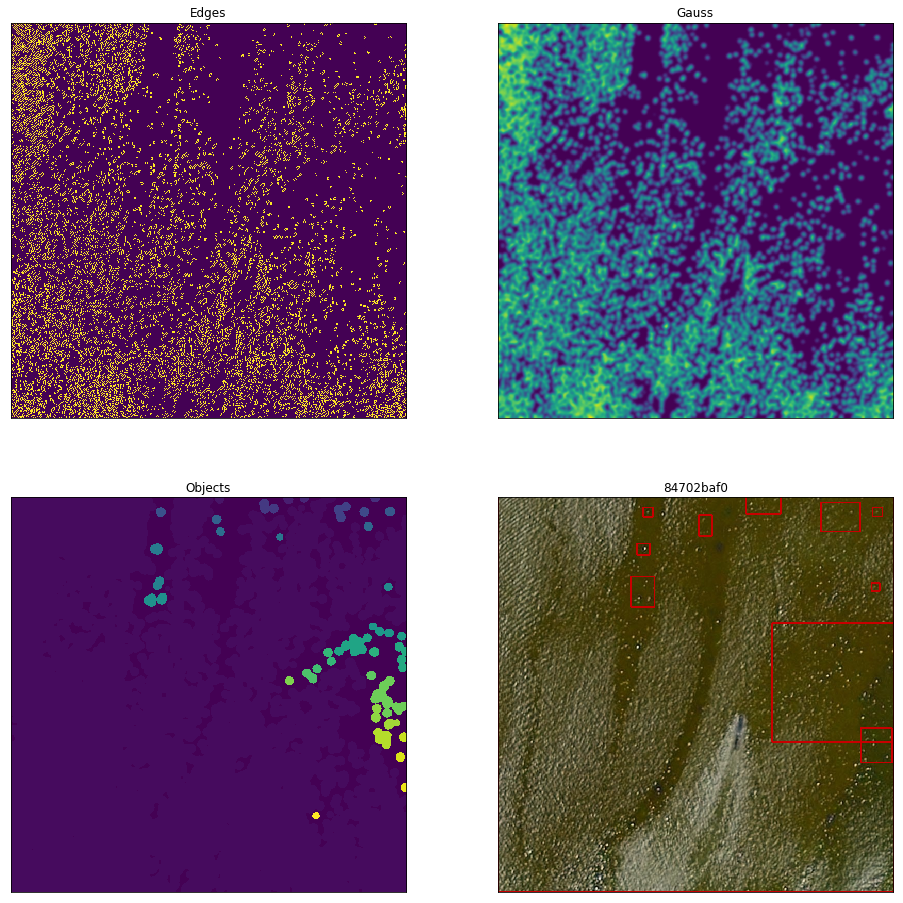

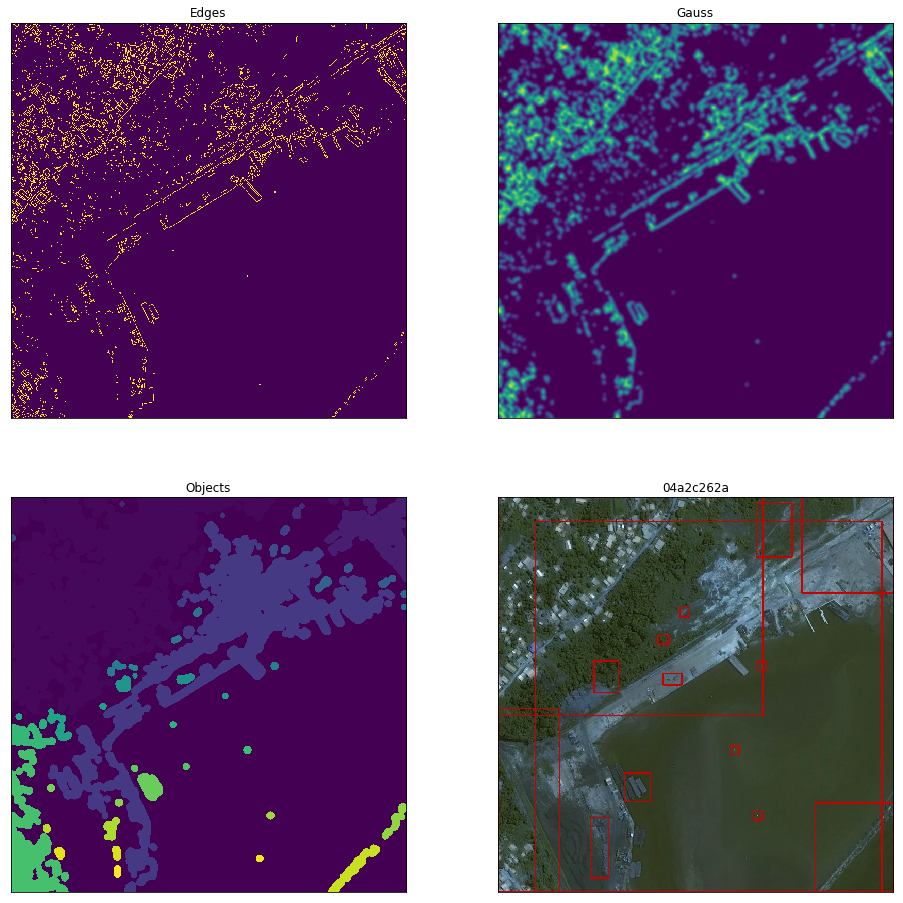

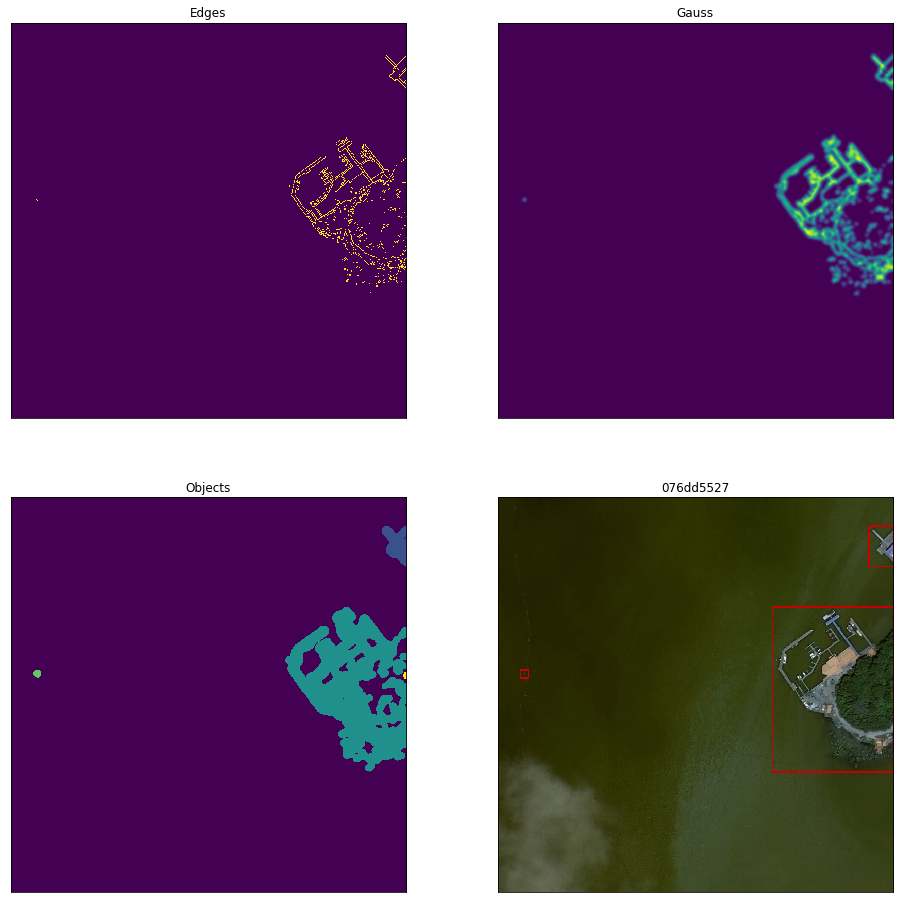

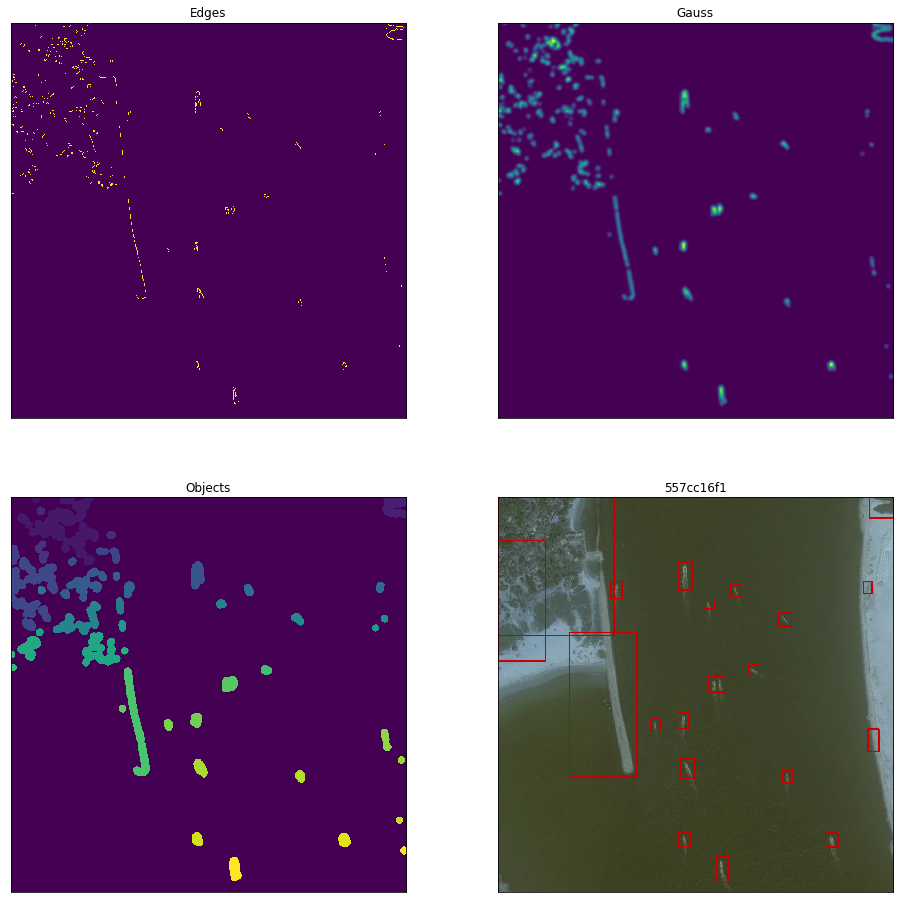

In [6]:
object_detection('ffea9a5ba')
object_detection('ffd9998b5')
object_detection('0a1a7f395')
object_detection('fff77c602')
object_detection('ffe932f98')
object_detection('ffe98da77')
object_detection('ffe89d4cb')
object_detection('ffe3ee83a')
object_detection('ffe2fcd0e')
object_detection('ffe2c660e')
object_detection('ffe1d7e9a')
object_detection('ffd1999b4')
object_detection('ffd164cf6')
object_detection('ffd122fb1')
object_detection('ffd45be26')
object_detection('ffd5c101e')
object_detection('ffd12ac28')
object_detection('ffce63261')
object_detection('ffcc5857f')
object_detection('ffc31f567')
object_detection('ffc4a4a05')
object_detection('845942f9a')
object_detection('8459c16c3')
object_detection('845a0bbe9')
object_detection('845c083f2') 
object_detection('845eb47e1')
object_detection('845f1e1c2')
object_detection('8460a460b')
object_detection('8461a7b9a')
object_detection('84629b8b6')
object_detection('84632f8a9')
object_detection('8465fda6c')
object_detection('8466dea85')
object_detection('84672e2e7')
object_detection('84698459c')
object_detection('846a1f09d')
object_detection('846a37651')
object_detection('846c5d08d')
object_detection('846c7862c')
object_detection('84702baf0')
object_detection('04a2c262a')
object_detection('076dd5527')
object_detection('557cc16f1')